<div class="alert alert-info">
    

# Yelp Reviews for Chicago Downtown Businesses
#  
<br>


    
**Author:**  Atef Bader, PhD
    
**Last Edit:**  11/1/2020

<br>
</div>

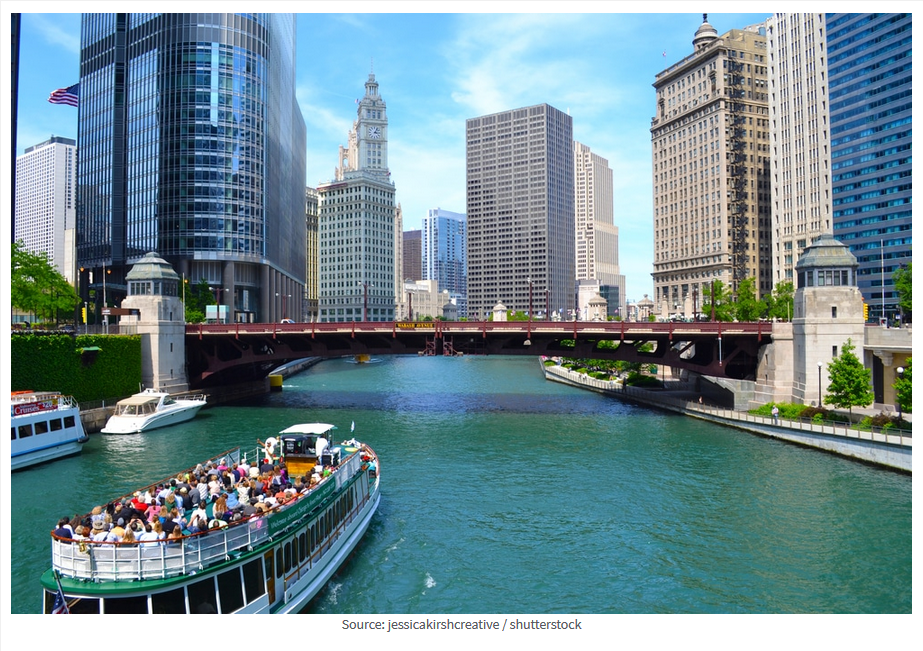

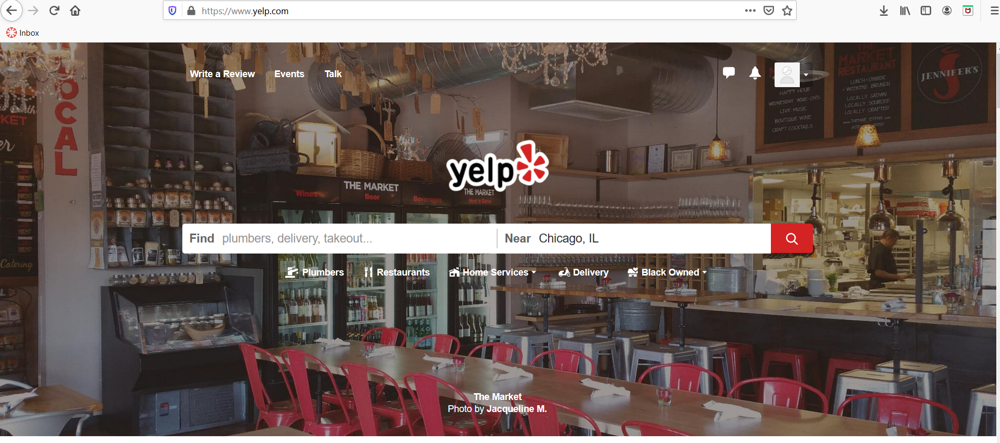

# Yelp

### You need to install Yelp API package before you run this script

- pip install yelpapi


### Here is the official URL for Yelp API docs:

https://www.yelp.com/developers/documentation/v3/get_started


### Use the business search on terms and sort on terms:
    
    https://www.yelp.com/developers/documentation/v3/business_search
    

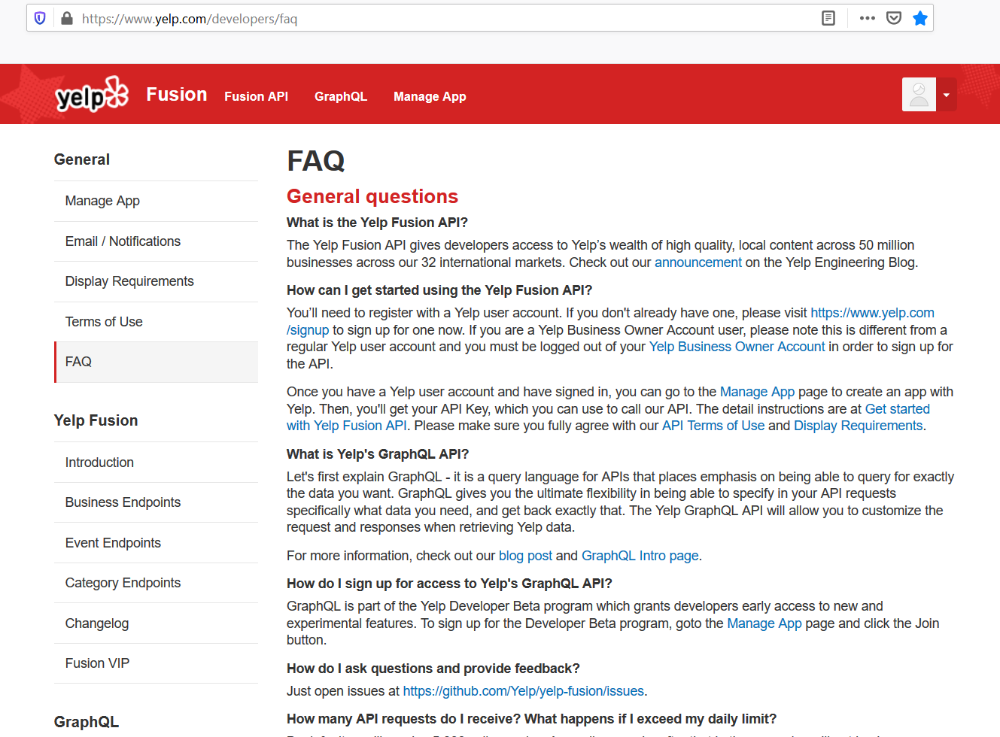

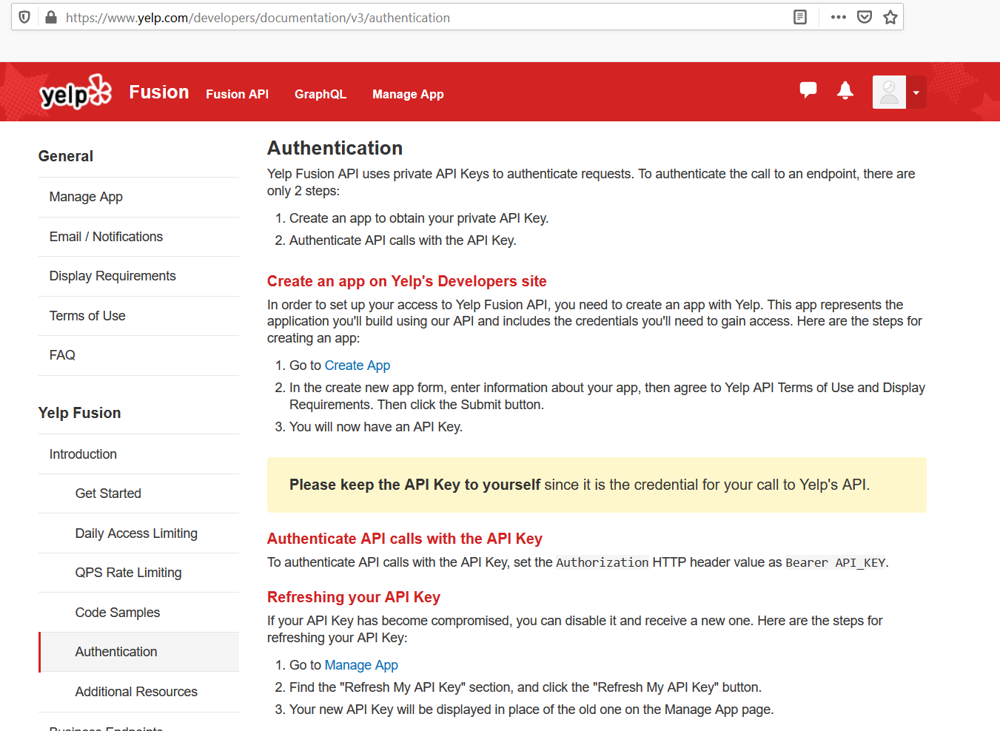

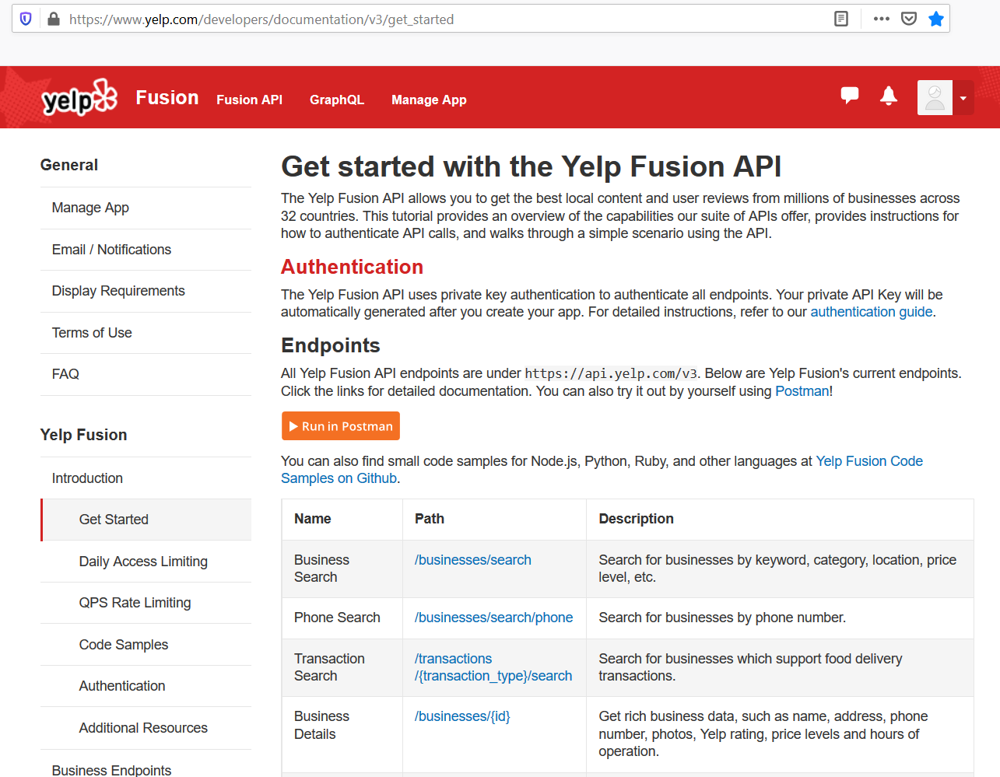

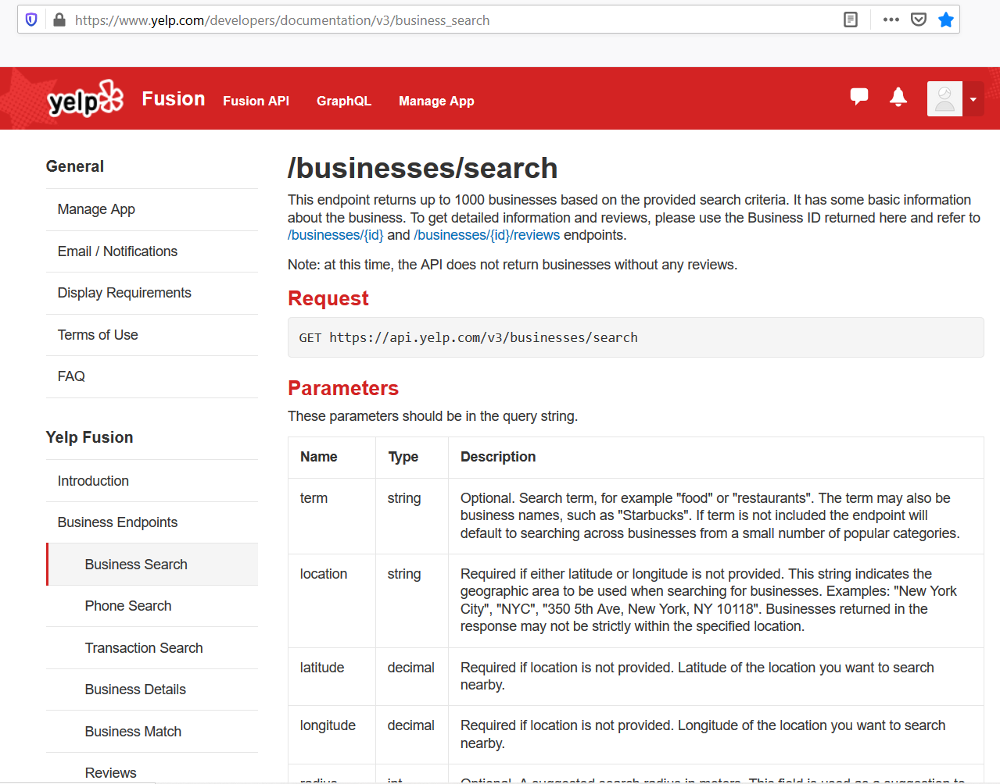


# Yelp Review for Chicago Businesses


We are interested to collect data about Chicago businesses from Yelp




# Why use Yelp data?

Imagine you are visiting Chicago for the first time and you like to get an idea about popular restaurants that serve Chicago-Style Food? 
- Chicago Style Hotdogs
- Chicago Style Pizza

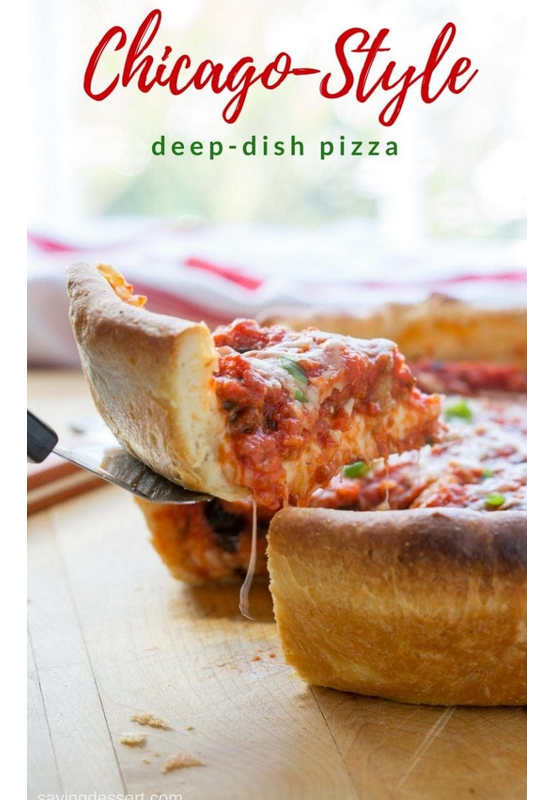


## Yelp has a significant dominance in US-traffic for consumer and business reviews; see below the rank of Yelp in the top-ten list


![image.png](attachment:image.png)




### Create your API Key:

Here is the URL for the developer API  in order to generate your App Key

https://www.yelp.com/developers/v3/manage_app


### Make a note of the following restrictions:

- The API **limit**  ,which is optional, can be used to specify the number of business results to return. By default, it will return 20. Maximum is 50.
- You have 5000 Yelp-API calls per day

See image below as an example and keep this in mind when you make calls to Yelp

![image.png](attachment:image.png)

# Chicago Community Areas

We are interested in the community areas of downtown chicago:

- Chicago Loop
- West Town
- Near North Side Chicago
- Near South Side Chicago
- Near West Side Chicago


You can see the official list for the Boundaries of different Community Areas at the following URL:

https://www.chicago.gov/city/en/depts/doit/dataset/boundaries_-_communityareas.html


![image.png](attachment:image.png)

## Install the following packages

1. Folium : 
**conda install -c conda-forge folium**

2. YelpApi : 
**pip install yelpapi**


## Create your API Key before you proceed

Here is the URL for the developer API  in order to generate key

https://www.yelp.com/developers/v3/manage_app


#### pip install yelp

In [1]:
import folium
from folium import plugins
from folium.plugins import MarkerCluster
import pandas as pd
import numpy
import numpy as np
import seaborn as sns

from yelpapi import YelpAPI

from pprint import pprint

yelp_api = YelpAPI('ADD-YOUR-API-KEY-HERE')



Please note that yelp limits the number businesses retruned to **50** so we need to spin through a loop tp retrieve the maximum number taht we can get from Yelp; the limit is 1000 businesses. And you are also limited to 5000 API calls per day.

The API business search docymentation is available at the following URL: https://www.yelp.com/developers/documentation/v3/business_search

Make a note of the following documentations **copied from Yelp API** for parameters limit and total:

- **limit** : The default number of business results to return is  20 and the Maximum limit can be set is 50.
- **total** :  	Total number of business Yelp finds based on the search criteria. Sometimes, the value may exceed 1000. In such case, you still can only get up to 1000 businesses. total may be limited to 40 for non-default sorts such as "distance" and "review_count".


Read the following question/amswer copied from (https://www.yelp.com/developers/faq) to see how to get the 1000 businesses:

**How do I get more than 50 results per request and how to get more than 1000 businesses?**

- The API can only return up to 1,000 results at this time. The API doesn't allow more than 50 per request. You need to use the offset parameter to get the next page of results. (For using offset, give it any number. If you have limit=50, that means you're getting results 1-50, so give it offset=51 and you'll get 51-100.)


**Warning:**If you attempt tp retrieve more than 1000 businesses you get the following error:

![image.png](attachment:image.png)


There are certain categories that are recognized by Yelp and accordingly index their reviews.
Visit the following URL to see the list: https://www.yelp.com/developers/documentation/v3/all_category_list

For **Chicago Social Hub**, we will collect businesses in the following categories
- Restaurants
- Entertainment
- Nightlife


In [2]:
import pandas as pd

df__business_reviews = pd.DataFrame()



## Chicago Downtown Neighborhoods and Zip-Codes


- **The following zip codes for Chicago downtown area and neighborhoods**
- **Visit the following website for  complete list of Chicago zip-codes for Chicago downtown area**

 (https://www.seechicagorealestate.com/chicago-zip-codes-by-neighborhood.php)


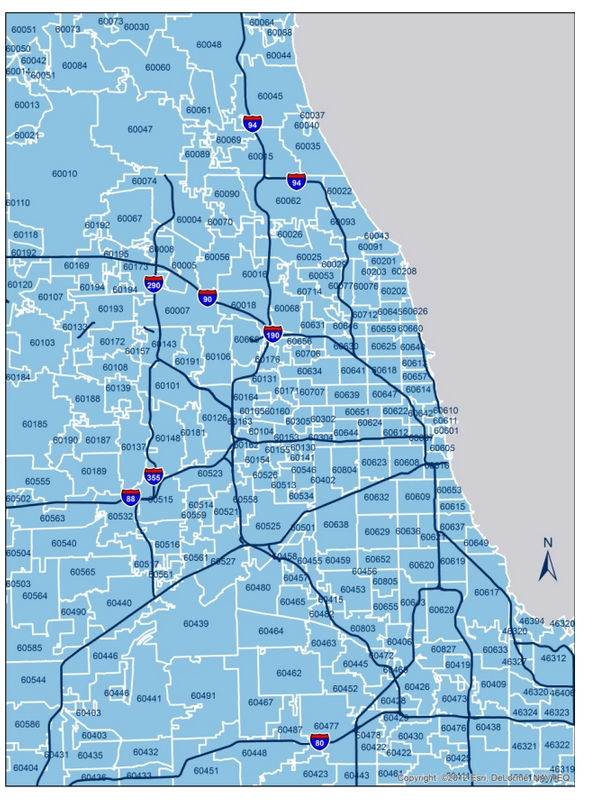

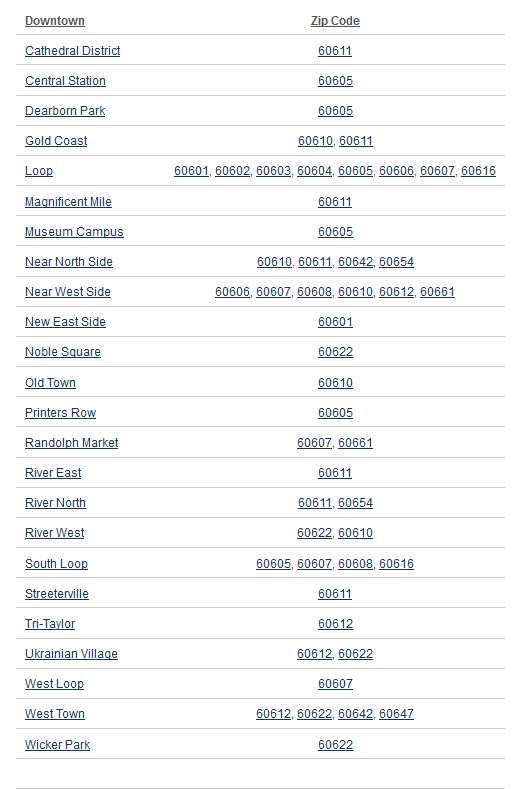

In [3]:
# The following zip codes for Chicago downtown area and neighborhoods.
# Visit the following website for Chicago complete list of zip-codes for Chicago downtown.
# (https://www.seechicagorealestate.com/chicago-zip-codes-by-neighborhood.php)


chicago_downtown_zipcodes = [60601, 60602, 60603, 60604, 60605, 60606, 60607, 60608, 60610, 60611, 60612, 60616]

df__business_reviews = pd.DataFrame()

for zip_code in chicago_downtown_zipcodes:
    for x in range(2):
        response = yelp_api.search_query(categories='Restaurants+Entertainment+Nightlife', location=zip_code, sort_by='rating', limit=50, offset=x*50)
        df__business_reviews = df__business_reviews.append(pd.DataFrame(response['businesses']))
    


In [4]:
type(response)

dict

In [5]:
pprint(response)

{'businesses': [{'alias': 'maggie-daley-park-chicago-park-district-chicago-2',
                 'categories': [{'alias': 'parks', 'title': 'Parks'},
                                {'alias': 'mini_golf', 'title': 'Mini Golf'},
                                {'alias': 'skatingrinks',
                                 'title': 'Skating Rinks'}],
                 'coordinates': {'latitude': 41.882361, 'longitude': -87.61944},
                 'display_phone': '(312) 552-3000',
                 'distance': 3921.169917634644,
                 'id': 'wILxEU86YqC5EgWsF0NnlQ',
                 'image_url': 'https://s3-media1.fl.yelpcdn.com/bphoto/vtcp-W0xiLSik2fuC7gyFw/o.jpg',
                 'is_closed': False,
                 'location': {'address1': '337 E Randolph',
                              'address2': '',
                              'address3': '',
                              'city': 'Chicago',
                              'country': 'US',
                              'displa

                              'display_address': ['2342 S Wentworth Ave',
                                                  'Chicago, IL 60616'],
                              'state': 'IL',
                              'zip_code': '60616'},
                 'name': 'Happy Lamb Hot Pot',
                 'phone': '+13129293224',
                 'price': '$$',
                 'rating': 4.5,
                 'review_count': 528,
                 'transactions': ['delivery'],
                 'url': 'https://www.yelp.com/biz/happy-lamb-hot-pot-chicago?adjust_creative=FGk8ItzJQUo_I5NBf5NuSA&utm_campaign=yelp_api_v3&utm_medium=api_v3_business_search&utm_source=FGk8ItzJQUo_I5NBf5NuSA'},
                {'alias': 'intelligentsia-coffee-chicago-8',
                 'categories': [{'alias': 'coffee', 'title': 'Coffee & Tea'}],
                 'coordinates': {'latitude': 41.877995,
                                 'longitude': -87.6295658341911},
                 'display_phone': '(312) 253-

                 'display_phone': '(312) 829-4757',
                 'distance': 2690.3179743802248,
                 'id': 'Zs1d1J9Gbk3gv7kusoNEVw',
                 'image_url': 'https://s3-media4.fl.yelpcdn.com/bphoto/0gT8p6Zsuc7tO3UFXiIafw/o.jpg',
                 'is_closed': False,
                 'location': {'address1': '1113 W 18th St',
                              'address2': '',
                              'address3': '',
                              'city': 'Chicago',
                              'country': 'US',
                              'display_address': ['1113 W 18th St',
                                                  'Chicago, IL 60608'],
                              'state': 'IL',
                              'zip_code': '60608'},
                 'name': 'Don Pedro Carnitas',
                 'phone': '+13128294757',
                 'price': '$$',
                 'rating': 4.5,
                 'review_count': 165,
                 'transactions': ['

In [6]:
df__business_reviews
df__business_reviews.columns.values.tolist()

['id',
 'alias',
 'name',
 'image_url',
 'is_closed',
 'url',
 'review_count',
 'categories',
 'rating',
 'coordinates',
 'transactions',
 'location',
 'phone',
 'display_phone',
 'distance',
 'price']

In [7]:
df__business_reviews.tail()

,id,alias,name,image_url,is_closed,url,review_count,categories,rating,coordinates,transactions,location,phone,display_phone,distance,price
45,Q1eYa96PKTgVhjlch3Wq5A,molly-s-cupcakes-chicago,Molly’s Cupcakes,https://s3-media3.fl.yelpcdn.com/bphoto/-Po26Z...,False,https://www.yelp.com/biz/molly-s-cupcakes-chic...,52,"[{'alias': 'desserts', 'title': 'Desserts'}, {...",4.5,"{'latitude': 41.8852558, 'longitude': -87.6519...","[pickup, delivery]","{'address1': '179 N Morgan St', 'address2': ''...",+13122852979,(312) 285-2979,4799.788303,NaN
46,Zs1d1J9Gbk3gv7kusoNEVw,don-pedro-carnitas-chicago,Don Pedro Carnitas,https://s3-media4.fl.yelpcdn.com/bphoto/0gT8p6...,False,https://www.yelp.com/biz/don-pedro-carnitas-ch...,165,"[{'alias': 'meats', 'title': 'Meat Shops'}, {'...",4.5,"{'latitude': 41.8577651977539, 'longitude': -8...","[pickup, delivery]","{'address1': '1113 W 18th St', 'address2': '',...",+13128294757,(312) 829-4757,2690.317974,$$
47,jsBWsX-6ceQxXYZ6E0CMWA,vol-39-chicago,Vol. 39,https://s3-media4.fl.yelpcdn.com/bphoto/_p6nxm...,False,https://www.yelp.com/biz/vol-39-chicago?adjust...,98,"[{'alias': 'wine_bars', 'title': 'Wine Bars'},...",4.5,"{'latitude': 41.88087, 'longitude': -87.63175}",[delivery],"{'address1': '39 S La Salle St', 'address2': '...",+13126049909,(312) 604-9909,3786.445400,$$$
48,3GXFsq9rJZUWXOJCQf-dIQ,maxs-take-out-chicago-3,Max's Take Out,https://s3-media1.fl.yelpcdn.com/bphoto/UiGXqg...,False,https://www.yelp.com/biz/maxs-take-out-chicago...,522,"[{'alias': 'tradamerican', 'title': 'American ...",4.0,"{'latitude': 41.87972, 'longitude': -87.62688}","[pickup, delivery]","{'address1': '20 E Adams St', 'address2': '', ...",+13125530170,(312) 553-0170,3609.221052,$
49,ZXhAQVhYD5vBn2ZLnID9FA,art-of-dosa-chicago-4,Art Of Dosa,https://s3-media2.fl.yelpcdn.com/bphoto/r7DhDT...,False,https://www.yelp.com/biz/art-of-dosa-chicago-4...,69,"[{'alias': 'indpak', 'title': 'Indian'}, {'ali...",4.5,"{'latitude': 41.8799308, 'longitude': -87.6305...","[pickup, delivery]","{'address1': '125 S Clark St', 'address2': '',...",+13128996238,(312) 899-6238,3661.545094,$$


In [16]:

df__business_reviews = df__business_reviews.reset_index(drop=True)

In [17]:
df__business_reviews.tail()

,id,alias,name,image_url,is_closed,url,review_count,categories,rating,coordinates,transactions,location,phone,display_phone,distance,price
1195,Q1eYa96PKTgVhjlch3Wq5A,molly-s-cupcakes-chicago,Molly’s Cupcakes,https://s3-media3.fl.yelpcdn.com/bphoto/-Po26Z...,False,https://www.yelp.com/biz/molly-s-cupcakes-chic...,52,"[{'alias': 'desserts', 'title': 'Desserts'}, {...",4.5,"{'latitude': 41.8852558, 'longitude': -87.6519...","[pickup, delivery]","{'address1': '179 N Morgan St', 'address2': ''...",+13122852979,(312) 285-2979,4799.788303,NaN
1196,Zs1d1J9Gbk3gv7kusoNEVw,don-pedro-carnitas-chicago,Don Pedro Carnitas,https://s3-media4.fl.yelpcdn.com/bphoto/0gT8p6...,False,https://www.yelp.com/biz/don-pedro-carnitas-ch...,165,"[{'alias': 'meats', 'title': 'Meat Shops'}, {'...",4.5,"{'latitude': 41.8577651977539, 'longitude': -8...","[pickup, delivery]","{'address1': '1113 W 18th St', 'address2': '',...",+13128294757,(312) 829-4757,2690.317974,$$
1197,jsBWsX-6ceQxXYZ6E0CMWA,vol-39-chicago,Vol. 39,https://s3-media4.fl.yelpcdn.com/bphoto/_p6nxm...,False,https://www.yelp.com/biz/vol-39-chicago?adjust...,98,"[{'alias': 'wine_bars', 'title': 'Wine Bars'},...",4.5,"{'latitude': 41.88087, 'longitude': -87.63175}",[delivery],"{'address1': '39 S La Salle St', 'address2': '...",+13126049909,(312) 604-9909,3786.445400,$$$
1198,3GXFsq9rJZUWXOJCQf-dIQ,maxs-take-out-chicago-3,Max's Take Out,https://s3-media1.fl.yelpcdn.com/bphoto/UiGXqg...,False,https://www.yelp.com/biz/maxs-take-out-chicago...,522,"[{'alias': 'tradamerican', 'title': 'American ...",4.0,"{'latitude': 41.87972, 'longitude': -87.62688}","[pickup, delivery]","{'address1': '20 E Adams St', 'address2': '', ...",+13125530170,(312) 553-0170,3609.221052,$
1199,ZXhAQVhYD5vBn2ZLnID9FA,art-of-dosa-chicago-4,Art Of Dosa,https://s3-media2.fl.yelpcdn.com/bphoto/r7DhDT...,False,https://www.yelp.com/biz/art-of-dosa-chicago-4...,69,"[{'alias': 'indpak', 'title': 'Indian'}, {'ali...",4.5,"{'latitude': 41.8799308, 'longitude': -87.6305...","[pickup, delivery]","{'address1': '125 S Clark St', 'address2': '',...",+13128996238,(312) 899-6238,3661.545094,$$


### Yelp review has the  field name coordinates field that has the latitude and longitude values
### We need to split that field and  add 2 columns for these fields in our dataframe

In [18]:
df__business_reviews.loc[0:len(df__business_reviews),'latitude']= np.NaN
df__business_reviews.loc[0:len(df__business_reviews),'longitude']= np.NaN

In [19]:
df__business_reviews.head()

,id,alias,name,image_url,is_closed,url,review_count,categories,rating,coordinates,transactions,location,phone,display_phone,distance,price,latitude,longitude
0,AkcZ1fUyB3RocKLYGFu20Q,art-institute-of-chicago-chicago-3,Art Institute of Chicago,https://s3-media2.fl.yelpcdn.com/bphoto/kp9B8B...,False,https://www.yelp.com/biz/art-institute-of-chic...,1842,"[{'alias': 'artschools', 'title': 'Art Schools...",4.5,"{'latitude': 41.8796, 'longitude': -87.623713}",[],"{'address1': '111 S Michigan Ave', 'address2':...",+13124433600,(312) 443-3600,589.553507,NaN,NaN,NaN
1,7GYatTFQXmWVpJXPqwHEUA,adagio-teas-chicago,Adagio Teas,https://s3-media4.fl.yelpcdn.com/bphoto/mVmFRh...,False,https://www.yelp.com/biz/adagio-teas-chicago?a...,357,"[{'alias': 'coffee', 'title': 'Coffee & Tea'},...",5.0,"{'latitude': 41.8928619739405, 'longitude': -8...",[delivery],"{'address1': '617 N State St', 'address2': '',...",+13126989773,(312) 698-9773,959.561900,$$,NaN,NaN
2,2DfcXGtDv7T_rnvl4lHzaQ,millennium-park-chicago,Millennium Park,https://s3-media1.fl.yelpcdn.com/bphoto/ElWdmI...,False,https://www.yelp.com/biz/millennium-park-chica...,1234,"[{'alias': 'parks', 'title': 'Parks'}]",4.5,"{'latitude': 41.88339, 'longitude': -87.6218446}",[],"{'address1': '201 E Randolph St', 'address2': ...",+13127421168,(312) 742-1168,213.138802,NaN,NaN,NaN
3,5s9ntZVD45n2CxboZnLbSg,the-cloud-gate-chicago,The Cloud Gate,https://s3-media1.fl.yelpcdn.com/bphoto/DIzp5M...,False,https://www.yelp.com/biz/the-cloud-gate-chicag...,787,"[{'alias': 'landmarks', 'title': 'Landmarks & ...",4.5,"{'latitude': 41.8825524, 'longitude': -87.6225...",[],"{'address1': '201 E Randolph St', 'address2': ...",+13127421168,(312) 742-1168,270.852426,NaN,NaN,NaN
4,apyIymDFbUK7u-Y3V5kmkA,bavettes-bar-and-boeuf-chicago,Bavette's Bar & Boeuf,https://s3-media3.fl.yelpcdn.com/bphoto/e-0zil...,False,https://www.yelp.com/biz/bavettes-bar-and-boeu...,2389,"[{'alias': 'steak', 'title': 'Steakhouses'}, {...",4.5,"{'latitude': 41.8892796234574, 'longitude': -8...",[delivery],"{'address1': '218 W Kinzie St', 'address2': ''...",+13126248154,(312) 624-8154,1061.214517,$$$,NaN,NaN


In [20]:
df__business_reviews.tail()

,id,alias,name,image_url,is_closed,url,review_count,categories,rating,coordinates,transactions,location,phone,display_phone,distance,price,latitude,longitude
1195,Q1eYa96PKTgVhjlch3Wq5A,molly-s-cupcakes-chicago,Molly’s Cupcakes,https://s3-media3.fl.yelpcdn.com/bphoto/-Po26Z...,False,https://www.yelp.com/biz/molly-s-cupcakes-chic...,52,"[{'alias': 'desserts', 'title': 'Desserts'}, {...",4.5,"{'latitude': 41.8852558, 'longitude': -87.6519...","[pickup, delivery]","{'address1': '179 N Morgan St', 'address2': ''...",+13122852979,(312) 285-2979,4799.788303,NaN,NaN,NaN
1196,Zs1d1J9Gbk3gv7kusoNEVw,don-pedro-carnitas-chicago,Don Pedro Carnitas,https://s3-media4.fl.yelpcdn.com/bphoto/0gT8p6...,False,https://www.yelp.com/biz/don-pedro-carnitas-ch...,165,"[{'alias': 'meats', 'title': 'Meat Shops'}, {'...",4.5,"{'latitude': 41.8577651977539, 'longitude': -8...","[pickup, delivery]","{'address1': '1113 W 18th St', 'address2': '',...",+13128294757,(312) 829-4757,2690.317974,$$,NaN,NaN
1197,jsBWsX-6ceQxXYZ6E0CMWA,vol-39-chicago,Vol. 39,https://s3-media4.fl.yelpcdn.com/bphoto/_p6nxm...,False,https://www.yelp.com/biz/vol-39-chicago?adjust...,98,"[{'alias': 'wine_bars', 'title': 'Wine Bars'},...",4.5,"{'latitude': 41.88087, 'longitude': -87.63175}",[delivery],"{'address1': '39 S La Salle St', 'address2': '...",+13126049909,(312) 604-9909,3786.445400,$$$,NaN,NaN
1198,3GXFsq9rJZUWXOJCQf-dIQ,maxs-take-out-chicago-3,Max's Take Out,https://s3-media1.fl.yelpcdn.com/bphoto/UiGXqg...,False,https://www.yelp.com/biz/maxs-take-out-chicago...,522,"[{'alias': 'tradamerican', 'title': 'American ...",4.0,"{'latitude': 41.87972, 'longitude': -87.62688}","[pickup, delivery]","{'address1': '20 E Adams St', 'address2': '', ...",+13125530170,(312) 553-0170,3609.221052,$,NaN,NaN
1199,ZXhAQVhYD5vBn2ZLnID9FA,art-of-dosa-chicago-4,Art Of Dosa,https://s3-media2.fl.yelpcdn.com/bphoto/r7DhDT...,False,https://www.yelp.com/biz/art-of-dosa-chicago-4...,69,"[{'alias': 'indpak', 'title': 'Indian'}, {'ali...",4.5,"{'latitude': 41.8799308, 'longitude': -87.6305...","[pickup, delivery]","{'address1': '125 S Clark St', 'address2': '',...",+13128996238,(312) 899-6238,3661.545094,$$,NaN,NaN


In [21]:
df__business_reviews.describe()

,review_count,rating,distance,latitude,longitude
count,1200.000000,1200.000000,1200.000000,0.0,0.0
mean,694.776667,4.332500,1807.882747,NaN,NaN
std,1146.649352,0.317455,2259.403301,NaN,NaN
min,15.000000,3.500000,47.860512,NaN,NaN
25%,137.000000,4.000000,633.322129,NaN,NaN
50%,350.000000,4.500000,1152.852901,NaN,NaN
75%,743.000000,4.500000,2214.996049,NaN,NaN
max,8685.000000,5.000000,50524.596673,NaN,NaN


### populate the lat and lng values in the dataframe


In [22]:
for i in range(0, len(df__business_reviews)):
    if df__business_reviews.iloc[i]['coordinates']:
        for coordinate_name, coordinate_value in df__business_reviews.iloc[i]['coordinates'].items():
            df__business_reviews.loc[i, coordinate_name]=coordinate_value, 

In [23]:
df__business_reviews[:1]

,id,alias,name,image_url,is_closed,url,review_count,categories,rating,coordinates,transactions,location,phone,display_phone,distance,price,latitude,longitude
0,AkcZ1fUyB3RocKLYGFu20Q,art-institute-of-chicago-chicago-3,Art Institute of Chicago,https://s3-media2.fl.yelpcdn.com/bphoto/kp9B8B...,False,https://www.yelp.com/biz/art-institute-of-chic...,1842,"[{'alias': 'artschools', 'title': 'Art Schools...",4.5,"{'latitude': 41.8796, 'longitude': -87.623713}",[],"{'address1': '111 S Michigan Ave', 'address2':...",+13124433600,(312) 443-3600,589.553507,NaN,41.8796,-87.623713


## Chicago-Style Food

Chicago is famous for **Chicago-style deep-dish** and you can read more about the origin of this term at the following link for the Chicago Tribune article: https://www.chicagotribune.com/news/ct-xpm-2009-02-18-0902180055-story.html, but Chicago is also know for its chicago-style-hot-dogs, https://en.wikipedia.org/wiki/Chicago-style_hot_dog.



When people visit Chicago, they like to taste these two types of food  that got Chicago signature:
- Pizza 
- Hot Dogs


Fo illustration purposes, we will consider the following two  famous restaurants in Chicago downtown:
- Portillo's - For Chicago Style Hot Dogs
- Giordano's - For Chicago-Style Pizza


**Note 1:**
Some of the business names might appear multiple timeas and accordingly leads to the conclusion that the dataset has redundant documents but that is not correct since a Restaruant Chain might have the same business name in  different locations and that is captured under the alias.

Here is an example for Potbelly Sandwich Shop:

'alias': 'potbelly-sandwich-shop-chicago-25'
'name': 'Potbelly Sandwich Shop',

'alias': 'potbelly-sandwich-shop-chicago-10'
'name': 'Potbelly Sandwich Shop'

**Note 2:**
Yelp reviews might refer to business names with or without **s** at the end of the business name. For exmple you might see reviews for business names:
- Portillo's or Portillo
- Giordano's or Giordano



In [24]:
df__business_reviews.name.value_counts()

Cafecito                      11
The Fat Shallot Food Truck    10
Alfred Caldwell Lily Pool     10
Brightwok Kitchen             10
Intelligentsia Coffee         10
                              ..
Ola's Liquor                   1
Big Shoulders Coffee           1
Truluck's                      1
Siri Restaurant Chicago        1
ARAMI                          1
Name: name, Length: 525, dtype: int64

### Lets get an idea about the outliers and missing values in our dataset

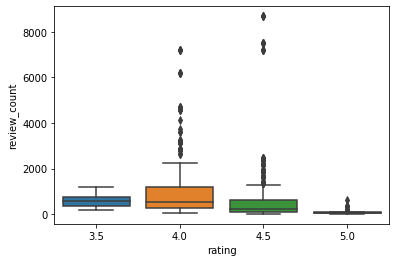

In [25]:
sns.boxplot(x='rating',y='review_count',data=df__business_reviews)

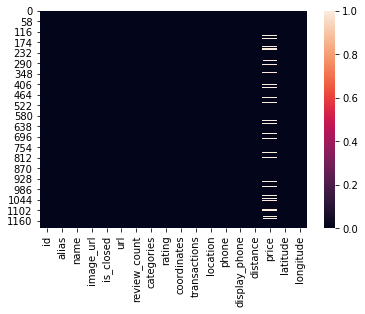

In [26]:

sns.heatmap(df__business_reviews.isnull())


### Lets create marker cluster map for those highly (rating is more than 3.5) recommended busnesses in green-icon and  red-icon otherwise

In [27]:

 
CHICAGO_COORDINATES = (41.8781, -87.6298)

 
# for debugging and unit testing purposes 
MAX_RECORDS = 1000
  
# create map centered/zoomed on Chicago downtown
map = folium.Map(location=CHICAGO_COORDINATES, zoom_start=15)

marker_cluster = MarkerCluster().add_to(map)
 
# add a marker for every reviewed business 
for index, row in df__business_reviews[0:MAX_RECORDS].iterrows():
    print(row["name"], row["latitude"], row["longitude"], row['location'])
    if not(numpy.isnan(row["latitude"]))  and   not(numpy.isnan(row["longitude"])) :
        if  row['rating'] > 3.5 :
            folium.Marker(location=(row["latitude"],row["longitude"]),popup=folium.Popup(html="Name: %s <br> <br> Location: %s <br> <br> Rating: %s" %(row["name"], row['location'],row['rating']), max_width=450),icon=folium.Icon(color='green', icon='ok-sign'),).add_to(marker_cluster)
        else:
            folium.Marker(location=(row["latitude"],row["longitude"]),popup=folium.Popup(html="Name: %s <br> <br> Location: %s <br> <br> Rating: %s" %(row["name"], row['location'],row['rating']), max_width=450),icon=folium.Icon(color='remove-sign', icon='ok-sign'),).add_to(marker_cluster)

       
        


Art Institute of Chicago 41.8796 -87.623713 {'address1': '111 S Michigan Ave', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60603', 'country': 'US', 'state': 'IL', 'display_address': ['111 S Michigan Ave', 'Chicago, IL 60603']}
Adagio Teas 41.8928619739405 -87.6278979714836 {'address1': '617 N State St', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60654', 'country': 'US', 'state': 'IL', 'display_address': ['617 N State St', 'Chicago, IL 60654']}
Millennium Park 41.88339 -87.6218446 {'address1': '201 E Randolph St', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60602', 'country': 'US', 'state': 'IL', 'display_address': ['201 E Randolph St', 'Chicago, IL 60602']}
The Cloud Gate 41.8825524 -87.6225514 {'address1': '201 E Randolph St', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60602', 'country': 'US', 'state': 'IL', 'display_address': ['201 E Randolph St', 'Chicago, IL 60602']}
Bavette's Bar & Boeuf 41.889279623

C:\Users\Atef\anaconda3\lib\site-packages\ipykernel_launcher.py:19: UserWarning: color argument of Icon should be one of: {'darkpurple', 'white', 'blue', 'lightblue', 'pink', 'darkblue', 'green', 'lightred', 'darkred', 'cadetblue', 'gray', 'black', 'red', 'darkgreen', 'beige', 'purple', 'orange', 'lightgray', 'lightgreen'}.


{'address1': '18 S Michigan Ave', 'address2': None, 'address3': '', 'city': 'Chicago', 'zip_code': '60603', 'country': 'US', 'state': 'IL', 'display_address': ['18 S Michigan Ave', 'Chicago, IL 60603']}
Café Media Noche 41.83263 -87.79437 {'address1': '6836 W Windsor Ave', 'address2': '', 'address3': None, 'city': 'Berwyn', 'zip_code': '60402', 'country': 'US', 'state': 'IL', 'display_address': ['6836 W Windsor Ave', 'Berwyn, IL 60402']}
Revival Food Hall 41.87979 -87.63051 {'address1': '125 S Clark St', 'address2': '', 'address3': None, 'city': 'Chicago', 'zip_code': '60603', 'country': 'US', 'state': 'IL', 'display_address': ['125 S Clark St', 'Chicago, IL 60603']}
Taketei Sushi 41.8717202 -87.624597 {'address1': '800 S Michigan Ave', 'address2': '', 'address3': None, 'city': 'Chicago', 'zip_code': '60605', 'country': 'US', 'state': 'IL', 'display_address': ['800 S Michigan Ave', 'Chicago, IL 60605']}
Poke Burrito 41.87611 -87.62903 {'address1': '423 S Dearborn St', 'address2': None,

Cindy's 41.8816894031196 -87.6250061730162 {'address1': '12 S Michigan Ave', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60603', 'country': 'US', 'state': 'IL', 'display_address': ['12 S Michigan Ave', 'Chicago, IL 60603']}
Oasis Cafe 41.882755 -87.6260309 {'address1': '21 N Wabash Ave', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60602', 'country': 'US', 'state': 'IL', 'display_address': ['21 N Wabash Ave', 'Chicago, IL 60602']}
The Marq 41.8796191 -87.6299253 {'address1': '60 West Adams St', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60603', 'country': 'US', 'state': 'IL', 'display_address': ['60 West Adams St', 'Chicago, IL 60603']}
Yolk - South Loop 41.8687801 -87.6242249 {'address1': '1120 S Michigan Ave', 'address2': None, 'address3': '', 'city': 'Chicago', 'zip_code': '60605', 'country': 'US', 'state': 'IL', 'display_address': ['1120 S Michigan Ave', 'Chicago, IL 60605']}
Rubi's at the New Maxwell Street Market 41.8718

Jackalope Coffee & Tea House 41.8360951 -87.6453228 {'address1': '755 W 32nd St', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60608', 'country': 'US', 'state': 'IL', 'display_address': ['755 W 32nd St', 'Chicago, IL 60608']}
Inspiration Kitchens 41.88502 -87.71402 {'address1': '3504 W Lake St', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60624', 'country': 'US', 'state': 'IL', 'display_address': ['3504 W Lake St', 'Chicago, IL 60624']}
El Taco Azteca 41.85185 -87.68029 {'address1': '2151 W Cermak Rd', 'address2': '', 'address3': None, 'city': 'Chicago', 'zip_code': '60608', 'country': 'US', 'state': 'IL', 'display_address': ['2151 W Cermak Rd', 'Chicago, IL 60608']}
Monteverde 41.88191 -87.65302 {'address1': '1020 W Madison St', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60607', 'country': 'US', 'state': 'IL', 'display_address': ['1020 W Madison St', 'Chicago, IL 60607']}
Green Street Smoked Meats 41.883623 -87.648907 {'addre

Sunny Side Up Breakfast & Lunch 41.8957916402964 -87.6263844966888 {'address1': '42 E Superior St', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60611', 'country': 'US', 'state': 'IL', 'display_address': ['42 E Superior St', 'Chicago, IL 60611']}
Starbucks Reserve Roastery Chicago 41.894111 -87.6246206089854 {'address1': '646 N Michigan Ave', 'address2': '', 'address3': None, 'city': 'Chicago', 'zip_code': '60611', 'country': 'US', 'state': 'IL', 'display_address': ['646 N Michigan Ave', 'Chicago, IL 60611']}
Rosebud on Rush 41.895633 -87.62571 {'address1': '720 N Rush St', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60611', 'country': 'US', 'state': 'IL', 'display_address': ['720 N Rush St', 'Chicago, IL 60611']}
Dollop Coffee & Tea 41.8924508684265 -87.6186701969267 {'address1': '345 E Ohio St', 'address2': '', 'address3': '', 'city': 'Chicago', 'zip_code': '60611', 'country': 'US', 'state': 'IL', 'display_address': ['345 E Ohio St', 'Chicago, I

In [28]:
# Show the map with the marker clusters

map

### Requirement #1:

Inspect the data you get from **Yelp** and comment on the quality of the data. Any NaN values? Any outliers? Are all category/alias values valid? etc.

<div class="alert  alert-warning">
    
Add your commentary here


<br>
</div>

### Requirement #2:

Provide at least 3 charts for the different features/fields in the dataset retrieved  from Yelp
- Bar Chart
- Stacked Bar Chart
- Scatter Chart
- HeatMap Chart
- Box Plot
- Scatter Plot




### Requirement #3:

Use the dataframe goupby and pivot tables to produce data per zipcode and per rating




### Requirement #4:

Modify the popup window in the folium map to display only **display_address** field rather than the entire content  of **location** field

### Requirement #5:

Modify the logic of the marker cluster map such that you show only the businesses that are in the category/alias **steak**